In [5]:

from pathlib import Path
import numpy as np
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
        
import os

import librosa
import librosa.display

import pandas as pd
pow2 = pd.DataFrame([2**i for i in range(15)], list(range(15))).transpose()
pow2


import matplotlib.animation as manimation
import wave

from matplotlib.ticker import FuncFormatter

%matplotlib inline


def kilo(x, pos):
    return '%1.1fk' % (x*1e-3)

In [ ]:

# -*- coding: utf-8 -*-
"""
@author: fabincarmo@gmail.com
"""

# Uncomment if you want to use TeX
# from matplotlib import rc
# rc('text', usetex=True)

# fontformat = {'family' : 'monospace',
#                 #'family':'serif', 
#               #'serif':['Computer Modern Roman'],        
#               #'monospace': ['Computer Modern Typewriter'], 
#               'size':9}

# rc('font', **fontformat)

def vidwav(wavfile, fps=25, mel=False):

    FFMpegWriter = manimation.writers['ffmpeg']
    metadata = dict(title='Wav Spectrogram', artist='Matplotlib',
            comment='')
    writer = FFMpegWriter(fps=fps, metadata=metadata, bitrate=3500)
    
    wf = wave.open(wavfile, 'rb')
    
    fs = wf.getframerate()
    N = wf.getnframes()
    duration = N/float(fs)
    bytes_per_sample = wf.getsampwidth()
    bits_per_sample  = bytes_per_sample * 8
    dtype = 'int{0}'.format(bits_per_sample)
    channels = wf.getnchannels()
    
    audio = np.frombuffer(wf.readframes(int(duration*fs*bytes_per_sample/channels)), dtype=dtype)
    audio = audio/max(abs(audio.min()),audio.max())
    audio.shape = (int(audio.shape[0]/channels), channels)
    freqs = np.fft.fftfreq(audio[:,0].shape[0], 1.0/fs) / 1000.0
    max_freq_kHz = freqs.max()
    times = np.arange(audio.shape[0]) / float(fs)
    # 1920, 1080
    fig = plt.figure(figsize=(6.4, 4.8))
    
    plt.subplot(16,1,(1,2))
    plt.plot(times, (audio[:,0]).astype(float)/np.max(np.abs(audio[:,0])), c='k', lw=.3)

    plt.xlim(0,duration)
    plt.ylim(-1,1)
    
    l1, = plt.plot([], [], '#333333', lw=2)
    
    plt.subplot(16,1,(4,16))

    n_fft = 1024
    hop_length = 128
    n_mels=128

    
    
    S = librosa.feature.melspectrogram( y=audio[:,0], sr=fs, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
    S_DB = librosa.power_to_db(S, ref=np.max)
    librosa.display.specshow(S_DB, sr=fs, hop_length=hop_length, x_axis='time', y_axis='mel');
    plt.colorbar(format='%+2.0f dB');

    
    #spectrum, freqs, t, im = plt.specgram(audio[:,0], NFFT=n_fft, Fs=fs, cmap=plt.get_cmap('magma'))
    #  'plasma', 'inferno', 'magma'
    plt.xlim(0,duration)
    plt.ylim(0,max_freq_kHz*1000.0)
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    formatter = FuncFormatter(kilo)
    ax = plt.gca()
    ax.yaxis.set_major_formatter(formatter)
    
    l2, = plt.plot([], [], '#333333', lw=2)
    
    #plt.tight_layout()
    plt.subplots_adjust(bottom=0.09, 
                                 right=0.98, 
                                 top=0.98, 
                                 left=0.1, 
                                 hspace=0.14)
    
    x = np.array([0., 0.])
    y0 = np.array([-1, 1])
    y1 = np.array([0, max_freq_kHz*1000.0])

    #return 
    with writer.saving(fig, "temp.mp4", 100):
        for i in range((int(duration)+1)*fps):
            x += 1.0/float(fps)
            l1.set_data(x,y0)
            
            l2.set_data(x,y1)
            writer.grab_frame()
    
    import os
    os.system('ffmpeg -y -i "'+wavfile+'" -i temp.mp4 -c:v copy -strict -2 "'+wavfile.split('.')[0]+'.mp4"')
    os.remove("temp.mp4")

    return fig

ffmpeg version 7.0 Copyright (c) 2000-2024 the FFmpeg developers
  built with gcc 12.3.0 (conda-forge gcc 12.3.0-7)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1715338855731/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1715338855731/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1715338855731/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1715338855731/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1715338855731/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libharfbuzz --enable-libfontconfig --enable-libope

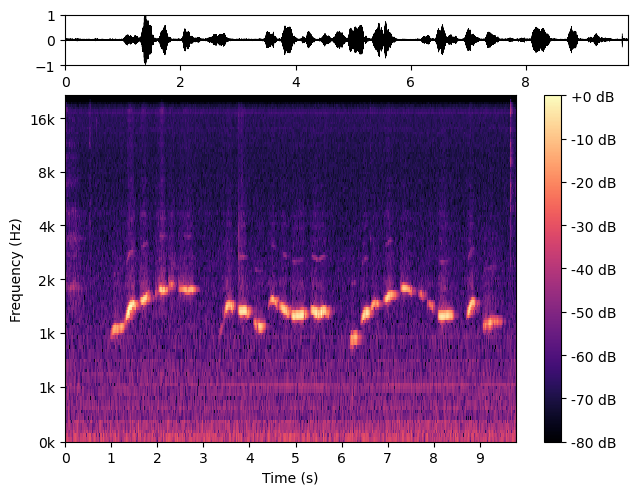

In [33]:

fig = vidwav("wantugone.wav")


ffmpeg version 6.0-6ubuntu1.1 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-4ubuntu3)
  configuration: --prefix=/usr --extra-version=6ubuntu1.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librist --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libtwolame --enable-libvidstab 

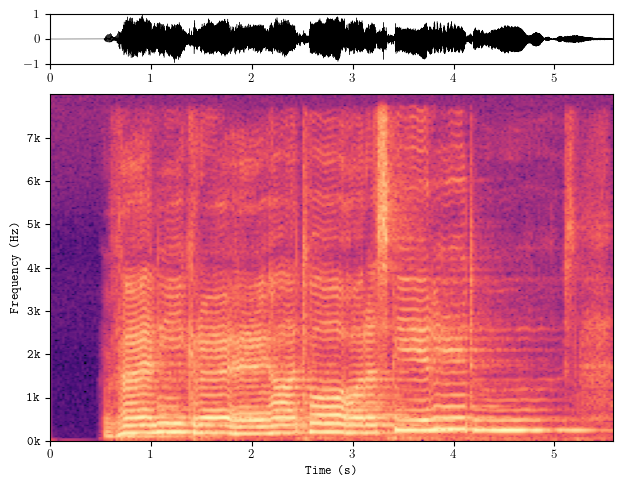

In [10]:

fig = vidwav("data.wav")


In [26]:
fig

In [ ]:
fig = vidwav("media/fyona.wav")

TODO: on the upper plot draw a spectrum of current frame 

In [13]:
fps=25
wavfile = "wantugone.wav"

FFMpegWriter = manimation.writers['ffmpeg']
metadata = dict(title='Wav Spectrogram', artist='Matplotlib',
        comment='')
writer = FFMpegWriter(fps=fps, metadata=metadata, bitrate=3500)

wf = wave.open(wavfile, 'rb')

fs = wf.getframerate()
N = wf.getnframes()
duration = N/float(fs)
bytes_per_sample = wf.getsampwidth()
bits_per_sample  = bytes_per_sample * 8
dtype = 'int{0}'.format(bits_per_sample)
channels = wf.getnchannels()

audio = np.frombuffer(wf.readframes(int(duration*fs*bytes_per_sample/channels)), dtype=dtype)


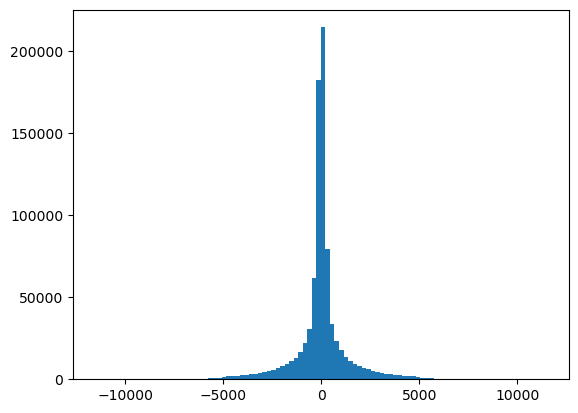

In [17]:
a = plt.hist(audio, bins=100)

In [23]:
audio_norm = audio/max(abs(audio.min()),audio.max())

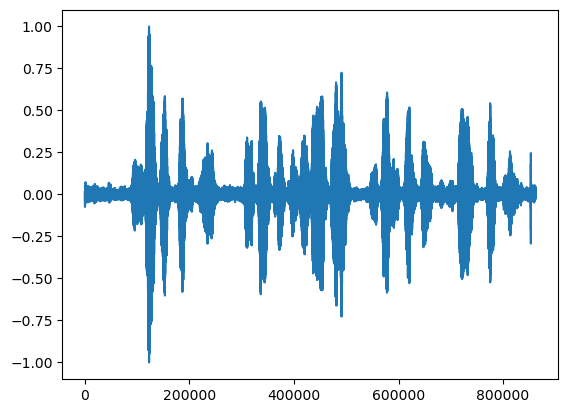

In [25]:
plt.plot(audio_norm)

In [23]:
# old version
def wav2mp4(wavfile, fps=25, scale = "hz", save = True, spec_params = {}):
    """
    scale can be: mel, hz, log
    """
    FFMpegWriter = manimation.writers['ffmpeg']
    metadata = dict(title='Wav Spectrogram', artist='Matplotlib', comment='')
    writer = FFMpegWriter(fps=fps, metadata=metadata, bitrate=3500)
    
    wf = wave.open(wavfile, 'rb')
    
    fs = wf.getframerate()
    N = wf.getnframes()
    duration = N/float(fs)
    bytes_per_sample = wf.getsampwidth()
    bits_per_sample  = bytes_per_sample * 8
    dtype = 'int{0}'.format(bits_per_sample)
    channels = wf.getnchannels()

    #TODO use librosa facilities for reading
    audio = np.frombuffer(wf.readframes(int(duration*fs*bytes_per_sample/channels)), dtype=dtype)
    audio = audio/max(abs(audio.min()),audio.max())
    audio.shape = (int(audio.shape[0]/channels), channels)
    freqs = np.fft.fftfreq(audio[:,0].shape[0], 1.0/fs) / 1000.0
    max_freq_kHz = freqs.max()
    times = np.arange(audio.shape[0]) / float(fs)
    
    
    # 1920, 1080
    #(19.20, 10.80)
    #(9.60,7.20)
    fig = plt.figure(figsize=(6.4, 4.8))#)
    
    plt.subplot(16,1,(1,2))
    plt.plot(times, (audio[:,0]).astype(float)/np.max(np.abs(audio[:,0])), c='b', lw=.3)

    plt.xlim(0,duration)
    plt.ylim(-1,1)
    
    l1, = plt.plot([], [], '#333333', lw=2)
    
    plt.subplot(16,1,(4,16))

    n_fft = 1024
    hop_length = 128
    n_mels=128

    if spec_params == {}: #default
        spec_params = {'n_fft': 1024, 'hop_length': 128, 'n_mels': 256}
    # hop length change not supported yet, see: 
    # https://github.com/librosa/librosa/issues/691
    print("drawing plot")
    
    if scale=='mel':
        S = librosa.feature.melspectrogram(y=audio[:,0], **spec_params) # sr=fs, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
        DB = librosa.power_to_db(S, ref=np.max)
        #librosa.display.specshow(S_DB, sr=fs, hop_length=hop_length, x_axis='time', y_axis='mel');
    else:
        spec_params.pop('n_mels', None)
        D = np.abs(librosa.stft(y=audio[:,0], **spec_params)) # n_fft=n_fft, hop_length=hop_length))  
        DB = librosa.amplitude_to_db(D, ref=np.max)
    
    librosa.display.specshow(DB, sr= fs, hop_length=hop_length, x_axis='time', y_axis=scale);
    
    #plt.colorbar((format='%+2.0f dB');
    
    
    #spectrum, freqs, t, im = plt.specgram(audio[:,0], NFFT=n_fft, Fs=fs, cmap=plt.get_cmap('magma'))
    #  'plasma', 'inferno', 'magma'
    plt.xlim(0,duration)
    plt.ylim(0,max_freq_kHz*1000.0)
    plt.xlabel('Time (sec)')
    plt.ylabel(f'Frequency (Hz) | Scale: {scale} | NFFT: {spec_params["n_fft"]}')
    formatter = FuncFormatter(kilo)
    ax = plt.gca()
    ax.yaxis.set_major_formatter(formatter)
    
    l2, = plt.plot([], [], '#333333', lw=2)
    
    #plt.tight_layout()
    plt.subplots_adjust(bottom=0.09, 
                                 right=0.98, 
                                 top=0.98, 
                                 left=0.11, 
                                 hspace=0.14)
    
    x = np.array([0., 0.])
    y0 = np.array([-1, 1])
    y1 = np.array([0, max_freq_kHz*1000.0])


    out_fname = wavfile.split('.')[0] + '.' + scale + '.' +  "{:05d}".format(spec_params["n_fft"]) 
    plt.savefig(out_fname + '.png')
    
    if save:       
        print("saving video")
        with writer.saving(fig, "temp.mp4", 100):
            n_frames = (int(duration)+1)*fps
            for i in range(n_frames):
                print(f"\rwrite frame {i+1}/{n_frames}", end="")
                x += 1.0/float(fps)
                l1.set_data(x,y0)                
                l2.set_data(x,y1)
                writer.grab_frame()               

        print("\nadding sound to video")
        os.system('ffmpeg -loglevel error -y -i "'+wavfile+'" -i temp.mp4 -c:v copy -strict -2 "'+ out_fname +'.mp4"')
        os.remove("temp.mp4")
        print("saved to " + out_fname +'.mp4')
    return fig


## wav2mp4

In [217]:

def wav2mp4(wavfile, spec_params = {}, scale = "linear", 
            figsize=(9.60,7.20), fps=25, cmap = 'magma', save = True ) :   
    """    
    spec_params: dict with these keys: {'n_fft': 1024, 'hop_length': 128, 'n_mels': 256}
    scale: mel, linear, log
    figsize: figure size, inches, default:  (9.60,7.20)
    cmap: colormap to use for spectrogram
    fps: desired video fps
    save: whether to actually save a video file
    """

    audio, fs = librosa.load(wavfile)
    # trim silent edges
    #audio, _ = librosa.effects.trim(audio)
          
    
    # 1920, 1080
    #(19.20, 10.80)
    #(9.60,7.20)
    #(6.4, 4.8)
    fig = plt.figure(figsize=(9.60,7.20))#)
    
    sig = fig.add_subplot(16,1,(1,2))
    sig.margins(x=0)

    librosa.display.waveshow(audio, sr=fs, axis='time',ax=sig);
    sig.set_xlabel('')

    
    l1, = sig.plot([], [], '#333333', lw=2)
    
    spec = fig.add_subplot(16,1,(3,16))

    if spec_params == {}: #default
        spec_params = {'n_fft': 1024, 'hop_length': 128, 'n_mels': 256}

    print("drawing spectrogram with params:", spec_params)
    
    if scale=='mel':
        S = librosa.feature.melspectrogram(y=audio, **spec_params) 
        DB = librosa.power_to_db(S, ref=np.max)

    else:
        spec_params.pop('n_mels', None) # not relevant for regular spectrograms
        D = np.abs(librosa.stft(y=audio, **spec_params)) 
        DB = librosa.amplitude_to_db(D, ref=np.max)
    
    librosa.display.specshow(DB, sr= fs, hop_length=spec_params['hop_length'], 
                             x_axis='time', y_axis=scale, ax = spec, cmap = cmap);
    
    #plt.colorbar((format='%+2.0f dB');
    
    

    spec.set_xlabel('Time (sec)')
    spec.set_ylabel(f'Frequency (Hz) | Scale: {scale} | NFFT: {spec_params["n_fft"]}')
    formatter = FuncFormatter(kilo)
    spec.yaxis.set_major_formatter(formatter)    
    l2, = spec.plot([], [], '#ffffff', lw=2)
    
    plt.tight_layout()
    plt.show()

    
    x = np.array([0., 0.])
    y0 = np.array([-1, 1])
    y1 = np.array([0, fs/2*1000.0])

    pth = Path(wavfile)    
    pts = list(pth.parts[:-1]+ (pth.stem + '.' + scale + '.' + "{:05d}".format(spec_params["n_fft"]),))
    out_fname = Path(*pts)

    #out_fname = wavfile.split('.')[0] + '.' + scale + '.' + "{:05d}".format(spec_params["n_fft"]) 
    fig.savefig(str(out_fname) + '.png')    
    
    if save:       
        print("saving video: " + str(out_fname) +'.mp4')
        duration = librosa.get_duration(y=audio, sr=fs)
        FFMpegWriter = manimation.writers['ffmpeg']
        metadata = dict(title='Wav Spectrogram', artist='Matplotlib', comment='')
        writer = FFMpegWriter(fps=fps, metadata=metadata, bitrate=3500)
    
        with writer.saving(fig, "temp.mp4", 100):
            n_frames = (int(duration)+1)*fps
            for i in range(n_frames):
                print(f"\rwrite frame {i+1}/{n_frames}", end="")
                x += 1.0/float(fps)
                l1.set_data(x,y0)                
                l2.set_data(x,y1)
                writer.grab_frame()               

        print("\nadding sound to video")
        os.system('ffmpeg -loglevel error -y -i "'+wavfile+
                  '" -i temp.mp4 -c:v copy -strict -2 "'+ str(out_fname) +'.mp4"')
        os.remove("temp.mp4")
        print("saved to " + str(out_fname) +'.mp4')
    return fig


drawing spectrogram with params: {'n_fft': 2048, 'hop_length': 128, 'n_mels': 256}


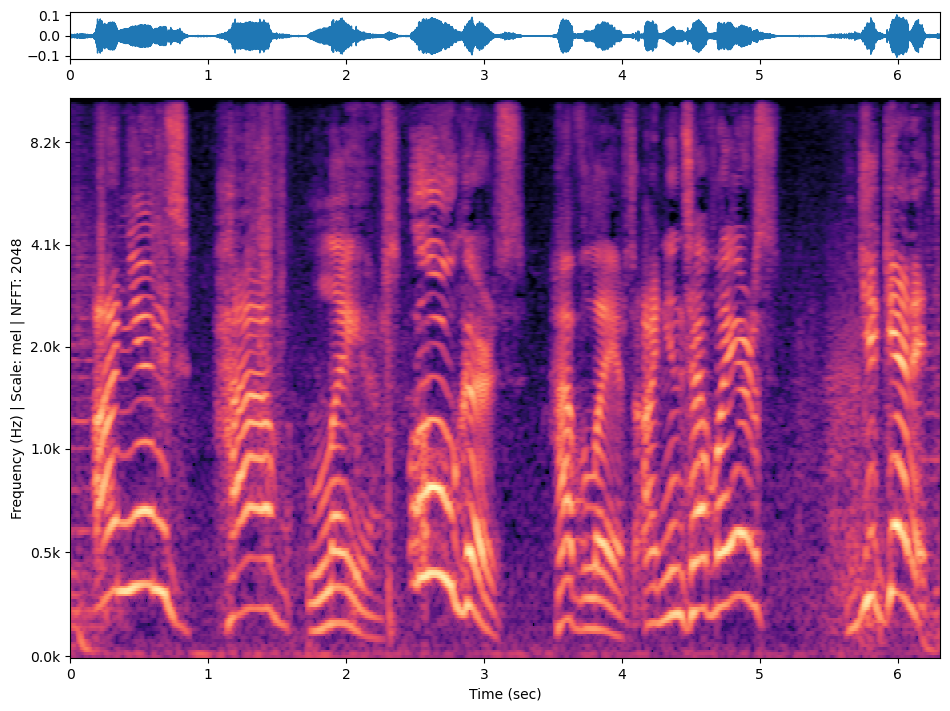

saving video: Media/layers.mel.02048.mp4
write frame 175/175
adding sound to video
saved to Media/layers.mel.02048.mp4


In [215]:
save = 1
sp = {'n_fft': 2**11, 'hop_length': 2**7, 'n_mels': 2**8}
fig = wav2mp4("Media/layers.wav", scale='mel', save=save, spec_params=sp)

drawing spectrogram with params: {'n_fft': 2048, 'hop_length': 128, 'n_mels': 256}


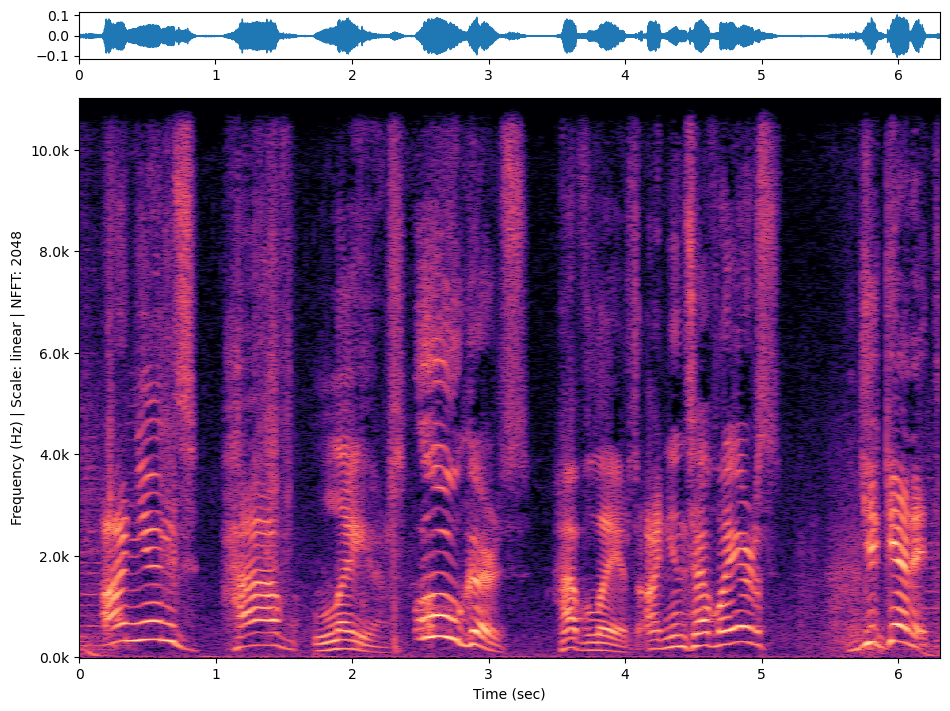

saving video: Media/layers.linear.02048.mp4
write frame 175/175
adding sound to video
saved to Media/layers.linear.02048.mp4


In [216]:
fig = wav2mp4("Media/layers.wav", scale='linear', spec_params=sp, save=save, )

In [20]:
spec_par = {'n_fft': 1024, 'hop_length': 128, 'n_mels': 128}
spec_par

{'n_fft': 1024, 'hop_length': 128, 'n_mels': 128}

In [21]:
save = 1

drawing plot
saving video
write frame 249/250
adding sound to video
saved to test/wantugone_wide.mel.02048.mp4


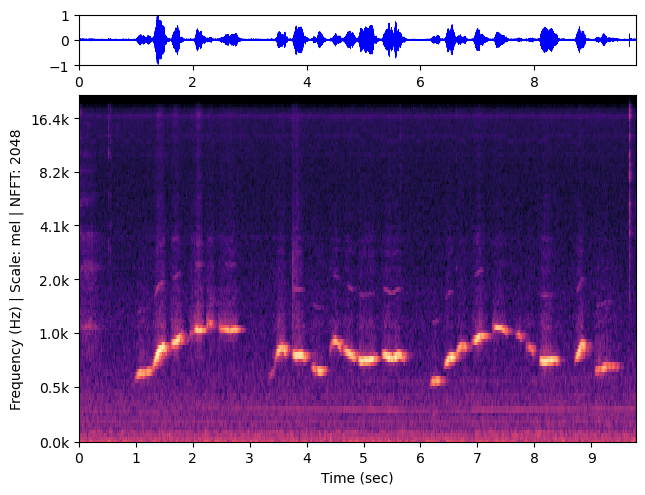

In [22]:
sp = {'n_fft': 2**11, 'hop_length': 128, 'n_mels': 128}
fig = wav2mp4("test/wantugone_wide.wav", scale = "mel", save=save, spec_params=sp)

drawing plot


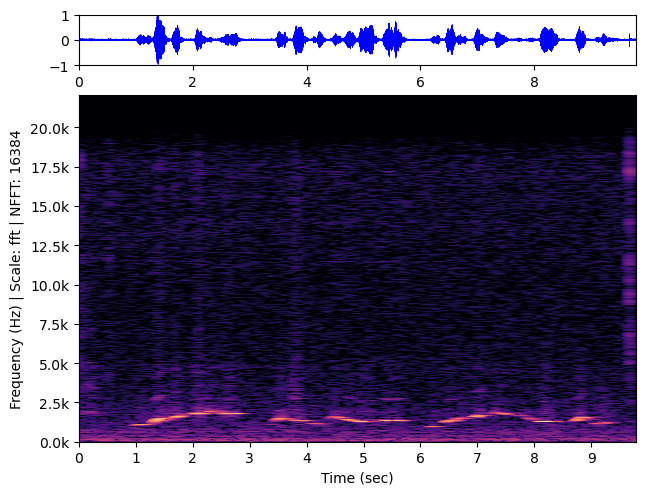

In [238]:
fig = wav2mp4("wantugone.wav", scale = "fft", save=save, spec_params=sp)

drawing plot


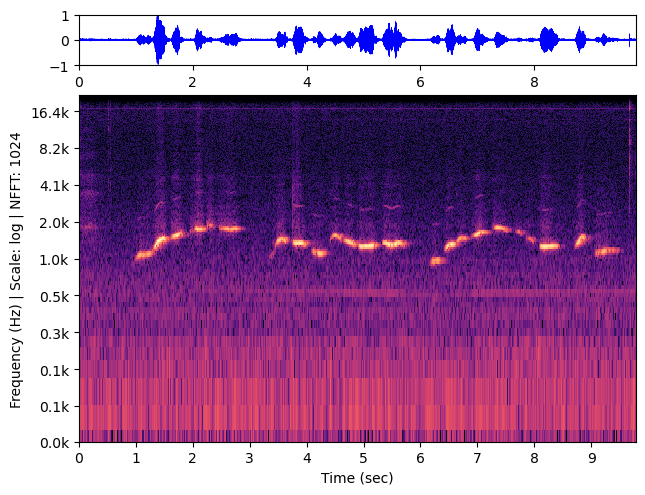

In [239]:
fig = wav2mp4("wantugone.wav", scale = "log", save=save)

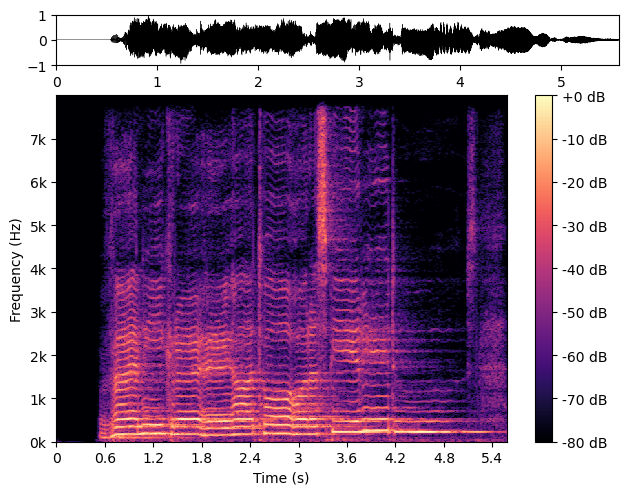

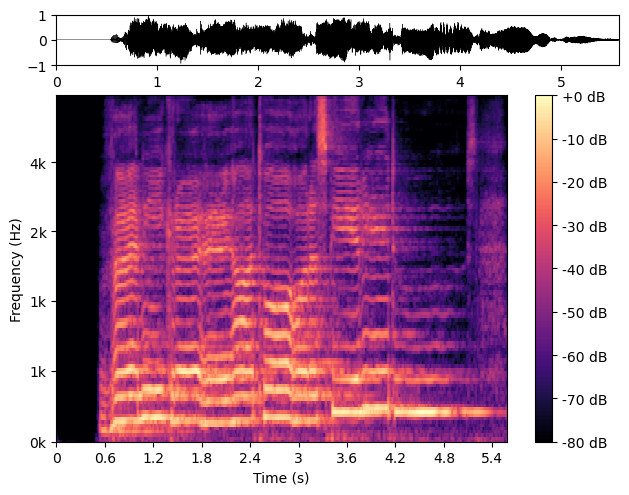

In [54]:
fig = wav2mp4("data.wav", mel=False, save=save)
fig = wav2mp4("data.wav", mel=True , save=save)

saving video
adding sound to video
saved to Media/fyona.hz.mp4
saving video
adding sound to video
saved to Media/fyona.mel.mp4


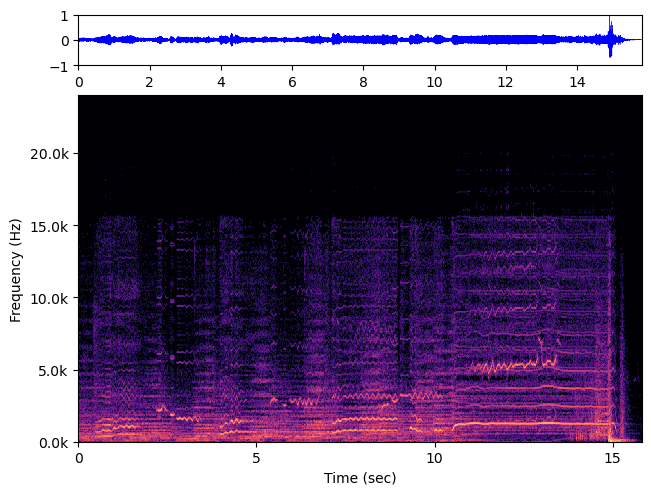

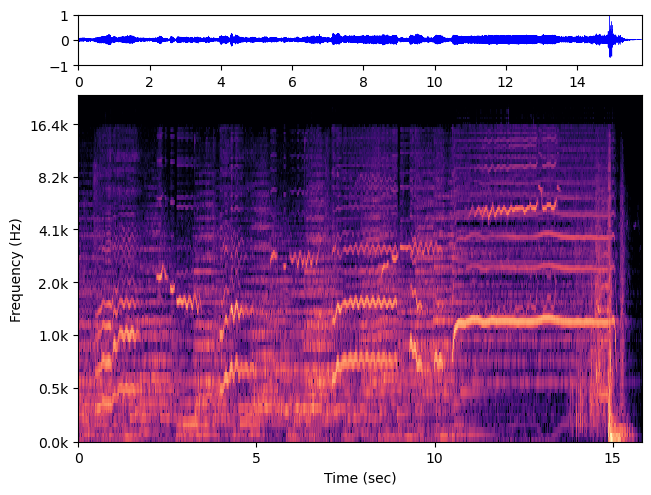

In [83]:
save = False
fig = wav2mp4("Media/fyona.wav", save=save)
fig = wav2mp4("Media/fyona.wav", scale='mel' , save=save)

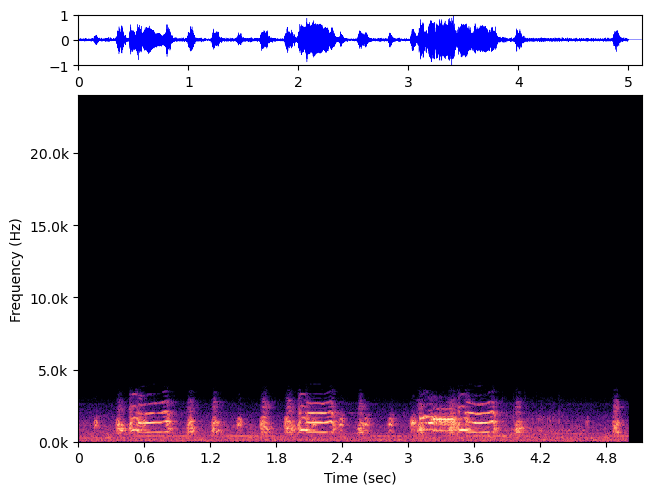

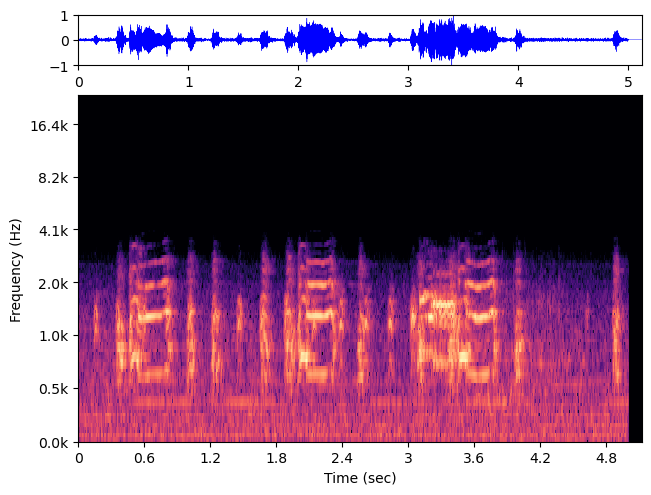

In [84]:
save = False
wav = "audiosr/vis_demo/event_up_2.wav"

fig = wav2mp4(wav, save=save)
fig = wav2mp4(wav, scale='mel' , save=save)

In [275]:
import glob
from PIL import Image
def make_gif(files_pattern = "*.png"):
    #f"{frame_folder}/*"
    glb = glob.glob(files_pattern)
    print(files_pattern)
    glb.sort()
    print(glb)
    frames = [Image.open(image) for image in glb]
    print(len(frames))
    frame_one = frames[0]
    outfile = files_pattern.replace("*","").replace(".png", ".gif")
    frame_one.save(outfile, format="GIF", append_images=frames,save_all=True, duration=700, loop=0)


drawing plot
drawing plot
drawing plot
drawing plot
drawing plot
drawing plot
['wantugone.linear.00256.png', 'wantugone.linear.00512.png', 'wantugone.linear.01024.png', 'wantugone.linear.02048.png', 'wantugone.linear.04096.png', 'wantugone.linear.08192.png']
6


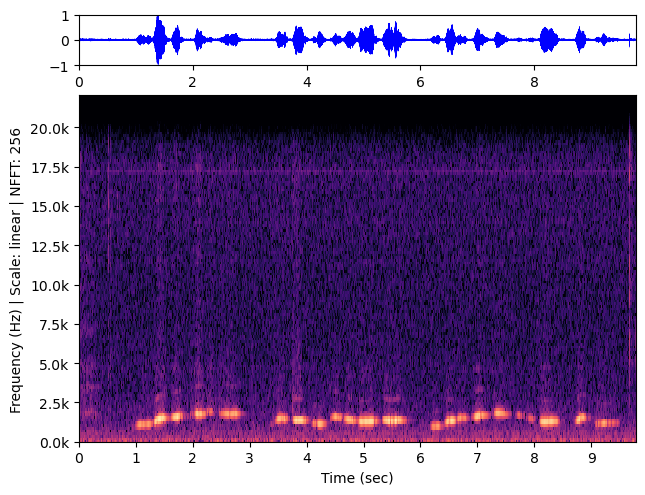

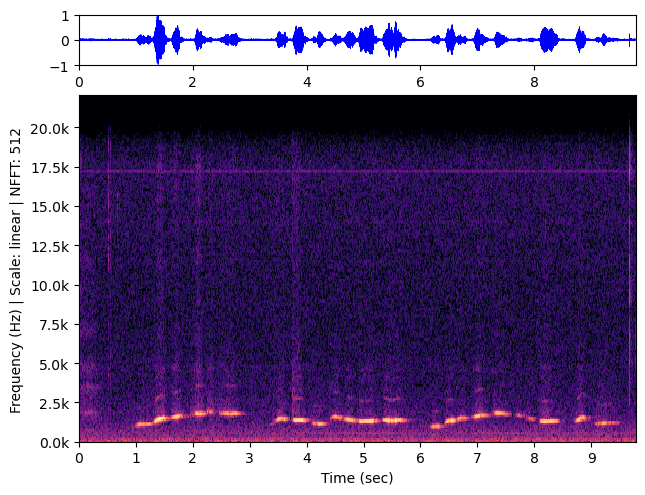

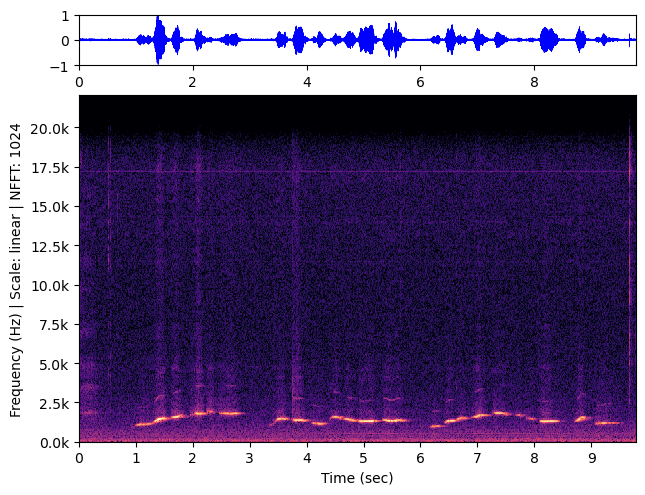

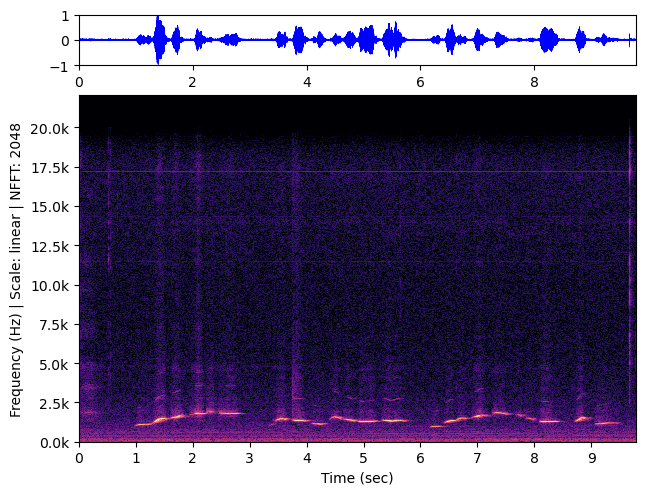

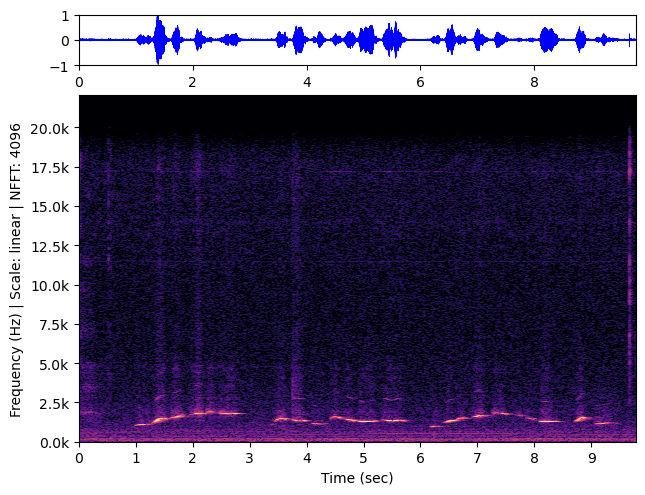

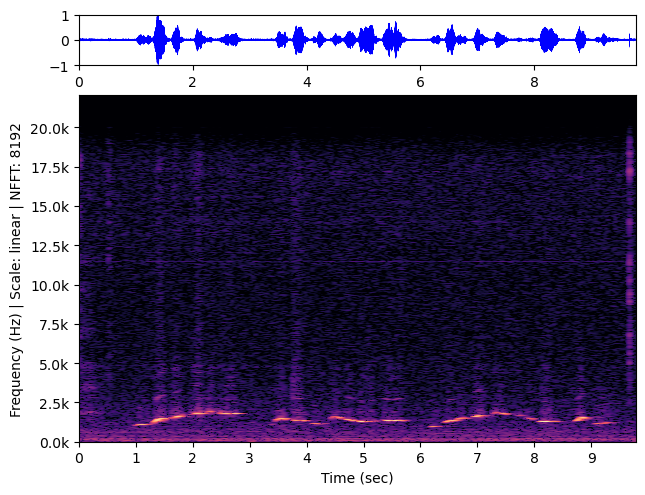

In [251]:
filename = "wantugone" # .wav
scale = "linear" #"mel" #
save = 0

for i in range(8,14):
    sp = {'n_fft': 2**i, 'hop_length': 128, 'n_mels': 32}
    fig = wav2mp4(filename + ".wav", scale = scale, save=save, spec_params=sp)

make_gif(f"{filename}.{scale}.*.png")

drawing plot
drawing plot
drawing plot
drawing plot
drawing plot
drawing plot
['Media/layers.mel.00256.png', 'Media/layers.mel.00512.png', 'Media/layers.mel.01024.png', 'Media/layers.mel.02048.png', 'Media/layers.mel.04096.png', 'Media/layers.mel.08192.png']
6


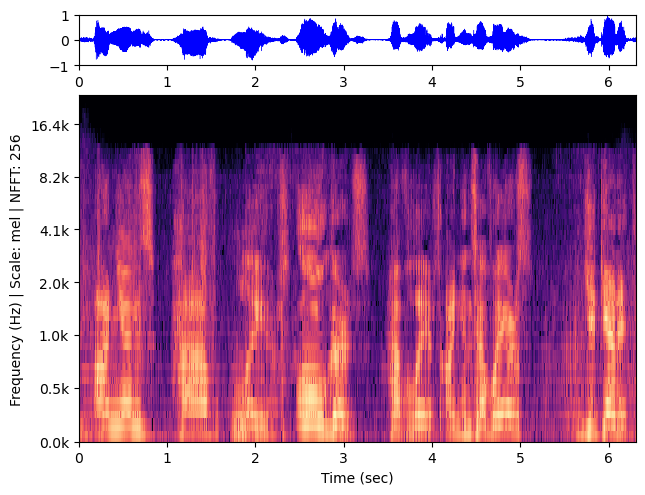

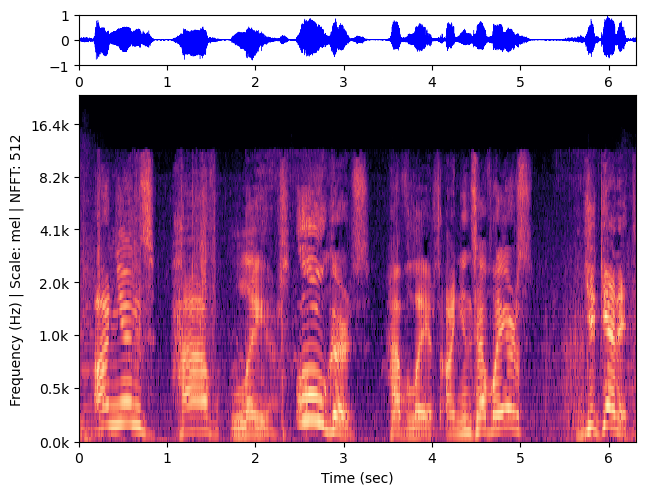

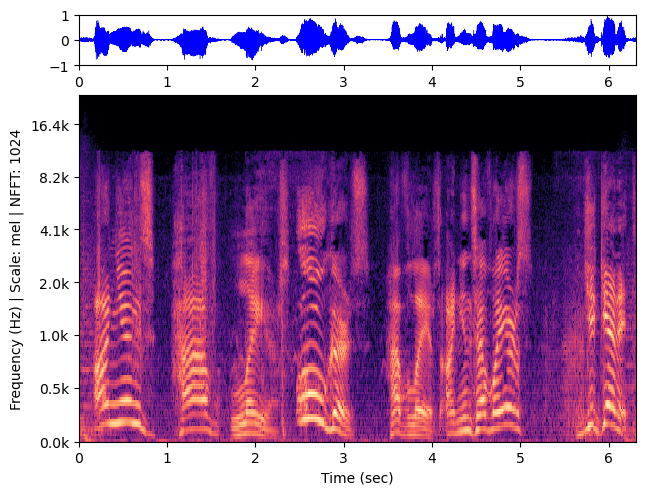

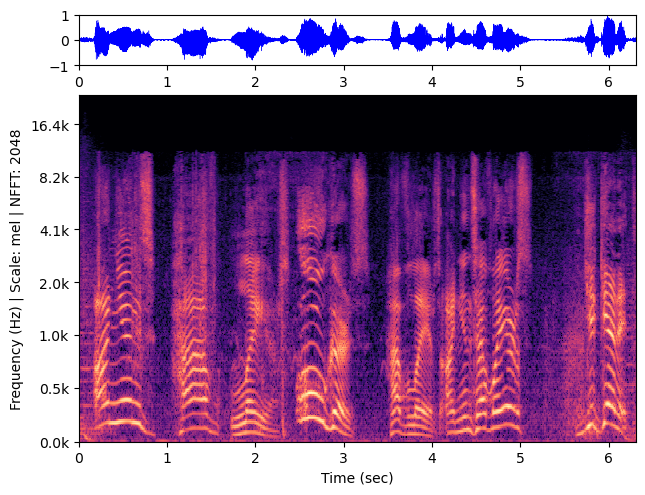

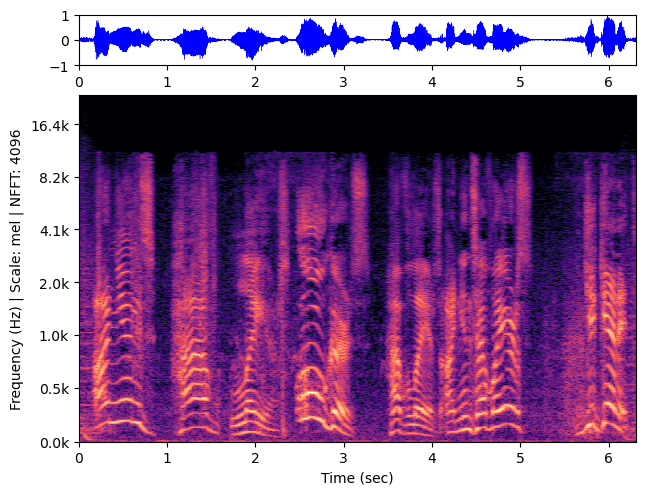

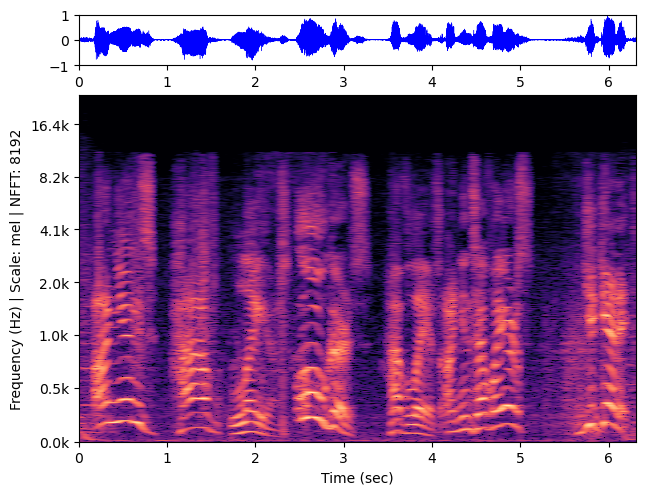

In [255]:
filename = "Media/layers" # .wav
scale = "mel" #"linear" #
save = 0

for i in range(8,14):
    sp = {'n_fft': 2**i, 'hop_length': 128, 'n_mels': 2**(i-2)}
    fig = wav2mp4(filename + ".wav", scale = scale, save=save, spec_params=sp)

make_gif(f"{filename}.{scale}.*.png")

In [258]:
! ffmpeg -i Media/lpf.mp3 Media/lpf.wav

83431.89s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
ffmpeg version 7.0 Copyright (c) 2000-2024 the FFmpeg developers
  built with gcc 12.3.0 (conda-forge gcc 12.3.0-7)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1715338855731/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1715338855731/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1715338855731/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1715338855731/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1715338855731/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-h

/tmp/ipykernel_1271221/3569687231.py:21: RuntimeWarning: overflow encountered in scalar absolute
  audio = audio/max(abs(audio.min()),audio.max())


drawing plot
saving video
adding sound to video
saved to Media/lpf.mel.02048.mp4


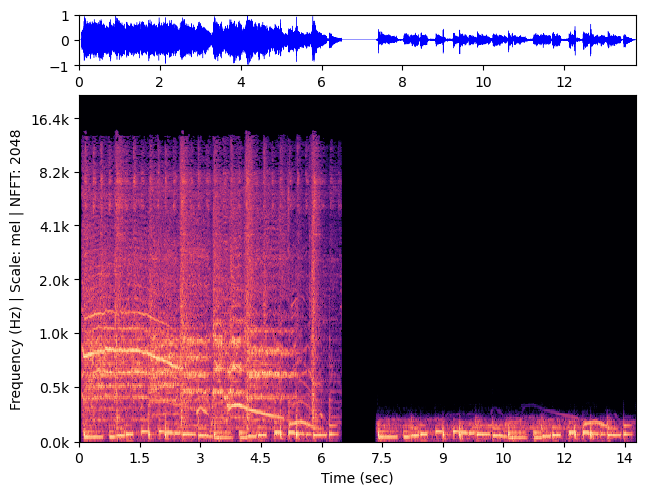

In [265]:
i=11
sp = {'n_fft': 2**i, 'hop_length': 128, 'n_mels': 2**(i-2)}
print(sp)
fig = wav2mp4("Media/lpf.wav", scale='mel' , save=1, spec_params=sp)

In [281]:
wavFFTs = """
spiritus.wav
fiona.wav
"""

wavMELs="""
sacrifice.wav
trumpet.wav
dolphin.wav
environment.wav
article_samples.wav
lpf.wav
"""

gifs = """
layers.*.mel.gif
layers.2048.*.gif
"""

In [284]:
for f in wavFFTs.strip().split("\n"):
    print(f)
print("bla")

spiritus.wav
fiona.wav
bla


## Begin videos

In [7]:
 # .wav
scale = "linear" #"mel" #
save = 1

drawing plot
saving video
adding sound to video
saved to Media/spiritus.linear.01024.mp4


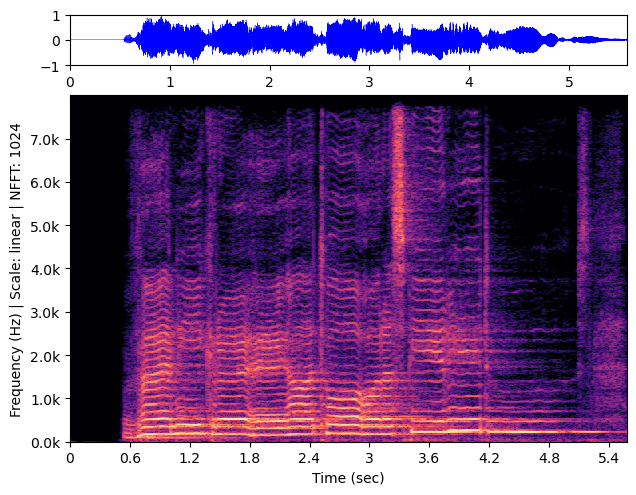

In [327]:
scale = "linear"
sp = {'n_fft': 1024, 'hop_length': 128, 'n_mels': 128}
fig = wav2mp4("Media/spiritus.wav", scale = scale, save=save, spec_params=sp)

### fiona

drawing plot
saving video
write frame 400/400
adding sound to video
saved to Media/fiona.linear.02048.mp4


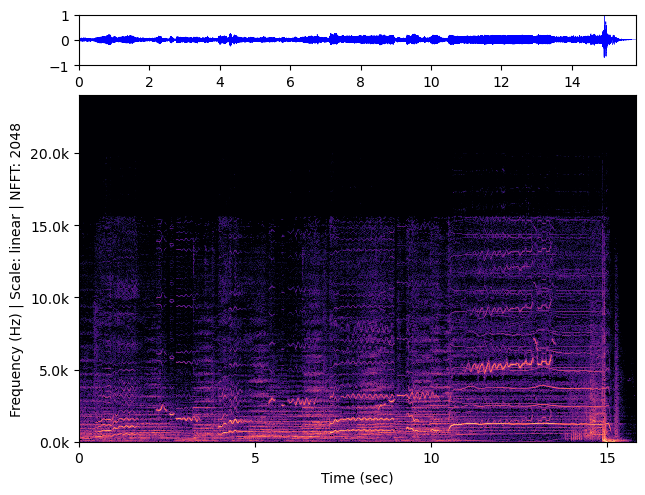

In [25]:
sp = {'n_fft': 2048, 'hop_length': 128, 'n_mels': 256}
fig = wav2mp4("Media/fiona.wav", scale = scale, save=save, spec_params=sp)

sacrifice.wav
trumpet.wav
dolphin.wav
environment.wav

music_gt_2.wav
music_audiosr_2.wav
music_up_2.wav
speech_gt_1.wav
speech_up_1.wav
speech_audiosr_1.wav
event_gt_3.wav
event_up_3.wav

lpf.wav

In [305]:
 # .wav
scale = "mel" #"linear" #


drawing plot
saving video
write frame 150/150
adding sound to video
saved to Media/sacrifice.mel.01024.mp4


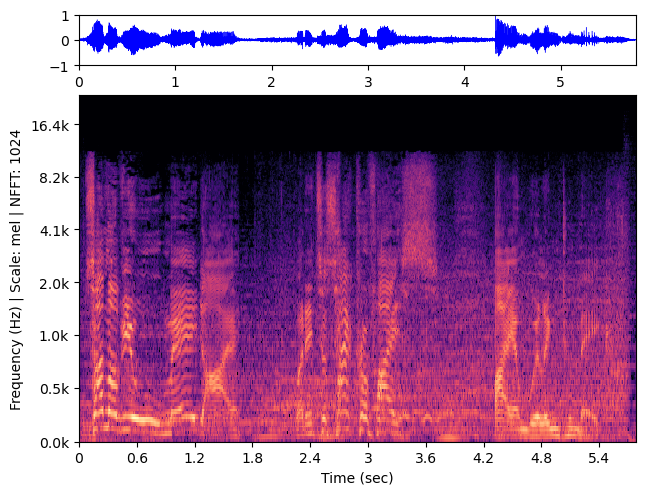

In [26]:
scale = "mel"
sp = {'n_fft': 1024, 'hop_length': 128, 'n_mels': 256}
fig = wav2mp4("Media/sacrifice.wav", scale = scale, save=save, spec_params=sp)

drawing plot
saving video
write frame 225/225
adding sound to video
saved to Media/trumpet.linear.01024.mp4


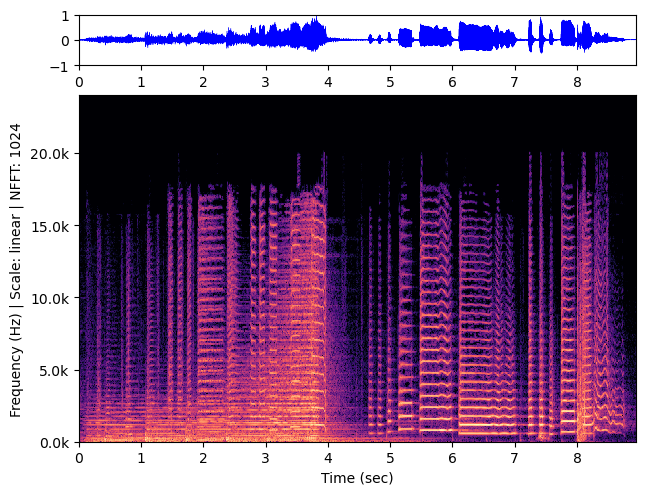

In [27]:
scale = "linear" 
sp = {'n_fft': 1024, 'hop_length': 128, 'n_mels': 256}
fig = wav2mp4("Media/trumpet.wav", scale = scale, save=save, spec_params=sp)

drawing plot
saving video
write frame 75/75
adding sound to video
saved to Media/dolphin.linear.01024.mp4


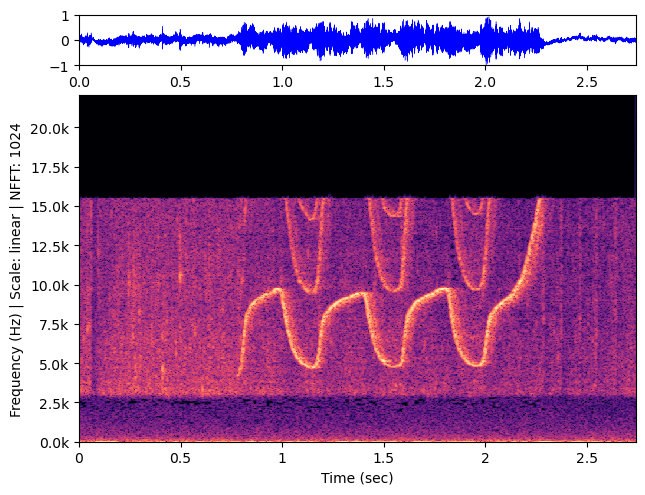

In [28]:
scale = "linear"
sp = {'n_fft': 1024, 'hop_length': 128, 'n_mels': 256}
fig = wav2mp4("Media/dolphin.wav", scale = scale, save=save, spec_params=sp)

/tmp/ipykernel_1646474/1738648081.py:21: RuntimeWarning: overflow encountered in scalar absolute
  audio = audio/max(abs(audio.min()),audio.max())


drawing plot
saving video
write frame 850/850
adding sound to video
saved to Media/environment.mel.02048.mp4


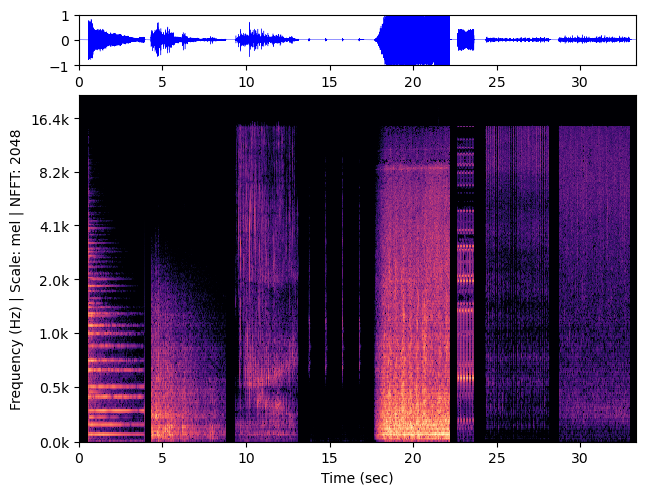

In [29]:
scale = "mel"
sp = {'n_fft': 2048, 'hop_length': 128, 'n_mels': 512}
fig = wav2mp4("Media/environment.wav", scale = scale, save=save, spec_params=sp)

drawing plot
saving video
write frame 150/150
adding sound to video
saved to Media/event_audiosr_3.mel.02048.mp4


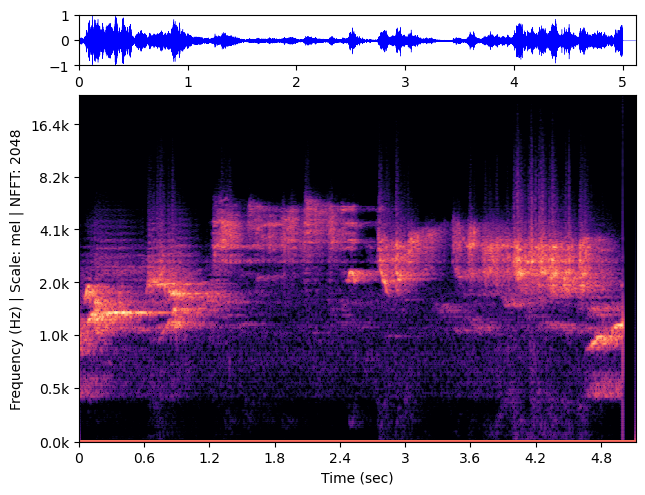

In [32]:
audiosr = """music_gt_2.wav
music_audiosr_2.wav
music_up_2.wav
speech_gt_1.wav
speech_up_1.wav
speech_audiosr_1.wav
event_gt_3.wav
event_up_3.wav"""


audiosr = "event_audiosr_3.wav"
scale = "mel" #"linear" #

i=11
for f in audiosr.split("\n"):
    
    sp = {'n_fft': 2**i, 'hop_length': 128, 'n_mels': 2**(i-2)}
    fig = wav2mp4("Media/" + f, scale = scale, save=save, spec_params=sp)


/tmp/ipykernel_1646474/1738648081.py:21: RuntimeWarning: overflow encountered in scalar absolute
  audio = audio/max(abs(audio.min()),audio.max())


drawing plot
saving video
write frame 350/350
adding sound to video
saved to Media/lpf.mel.02048.mp4


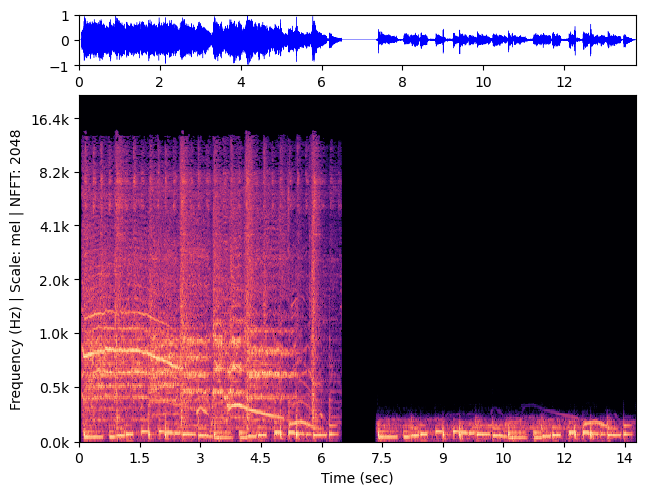

In [31]:
scale = "mel"
sp = {'n_fft': 2048, 'hop_length': 128, 'n_mels': 512}
fig = wav2mp4("Media/lpf.wav", scale = scale, save=save, spec_params=sp)

## GIFs

drawing plot
drawing plot
Media/layers.*.02048.png
['Media/layers.linear.02048.png', 'Media/layers.mel.02048.png']
2


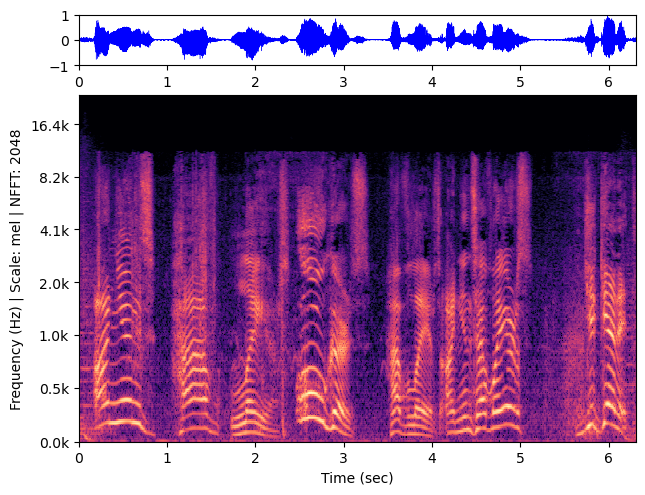

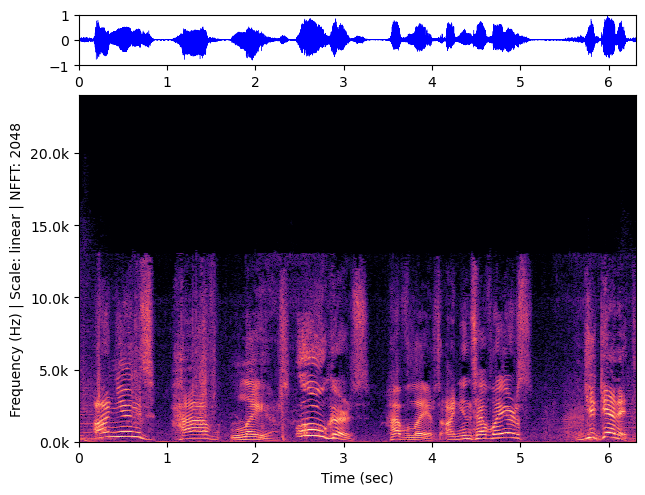

In [279]:
filename = "Media/layers" # .wav
scale = "mel" #"linear" #
i=11
save = 0

for j in ["mel","linear"]:
    
    sp = {'n_fft': 2**i, 'hop_length': 128, 'n_mels': 2**(i-2)}
    fig = wav2mp4(filename + ".wav", scale = j, save=save, spec_params=sp)

make_gif(f"{filename}.*.0{2**i}.png")